<a href="https://colab.research.google.com/github/DamaKubu/Fizikos-bakalauras/blob/main/Wavelet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bibliotekos



In [ ]:
#Pips

!pip install MFDFA
!pip install hurst
!pip install fbm
!pip install hurst

In [ ]:
#pagal https://ipython-books.github.io/134-simulating-a-stochastic-differential-equation/
#coocbook
import time
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


In [ ]:
## imports

import numpy as np
import matplotlib.pyplot as plt
from functools import partial
import time
from hurst import compute_Hc


from fbm import FBM
import math
from scipy import stats

# Imports
from MFDFA import MFDFA
from MFDFA import fgn
# where this second library is to generate fractional Gaussian noises


from hurst import compute_Hc, random_walk


plt.rcParams["figure.figsize"] = (5,5)
## constants and shit

from ipywidgets import interact, interactive, fixed, interact_manual
from scipy import stats
# Two-sided inverse Students t-distribution
from scipy.stats import t
# plt.figure()
# plt.subplot(311) #subplot(nrows, ncols, index, **kwargs)
# plt.scatter(x, y, s=0.0001)
# plt.subplot(312)
def plotLinearFit(x,y,xlabel='xlabel',ylabel='ylabel',plot=True,s=0.05):
    # p - probability, df - degrees of freedom
    tinv = lambda p, df: abs(t.ppf(p/2, df))
    ts = tinv(0.05, len(x)-2)
    res = stats.linregress(x, y)
    if plot == True:
        Nuokrypis = f"slope (95%): {res.slope:.6f} +/- {ts*res.stderr:.6f} \n intercept (95%): {res.intercept:.6f} +/- {ts*res.intercept_stderr:.6f}\n using Students two-sided t-distribution"
        plt.figure(figsize=(10,5))
        plt.scatter(x,y,s,label='original data')
        plt.plot(x, res.intercept + res.slope*x, 'r', label=Nuokrypis)
        plt.legend()
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.show()

    return res.slope

In [ ]:
!pip install waipy
import waipy
%matplotlib inline
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

  Preparing metadata (setup.py) ... done
  Created wheel for waipy: filename=waipy-0.1.51-py3-none-any.whl size=16787 sha256=d366f418757f382684c08bf4af985a5140b739511c1e4f4e0c8807cdb6637022
  Stored in directory: /root/.cache/pip/wheels/ca/c2/4b/a1c339638c96a5a307549fabd1f9558a8fc2d8ef26ea82a9d8
Successfully built waipy


# Funkcijos

In [ ]:
def higuchi1(a, k_max = 10):
        L = []
        x = []
        N = len(a)

        for k in range(1,k_max):
            Lk = 0
            for m in range(0,k):
                #we pregenerate all idxs
                idxs = np.arange(1,int(np.floor((N-m)/k)),dtype=np.int32)
                Lmk = np.sum(np.abs(a[m+idxs*k] - a[m+k*(idxs-1)]))
                Lmk = (Lmk*(N - 1)/(((N - m)/ k)* k)) / k
                Lk += Lmk

            L.append(np.log(Lk/(m+1)))
            x.append([np.log(1.0/ k), 1])

        (p, r1, r2, s)=np.linalg.lstsq(x, L,rcond=-1)
        return p[0]

In [ ]:
#
def skirstinys(xx, e1, e2, N=100, k = 0.1, x_pradinis = 0, TT = 10000, bins = 40 ):

    fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(7, 4))

    epsilonai = f"$\\epsilon_1 = ${e1:2.2f},   $\\epsilon_2 = ${e2:2.2f}"
    parametrai = f"\n N = {N}, $x_0$ = {x_pradinis}, iteracijos = {TT}"



    #xx
    ax[0].set_title(f"Gautas tikimybės skirstinys: "+epsilonai+parametrai)
    counts, bins = np.histogram(xx, bins = bins )
    ax[0].stairs(counts, bins)
    ax[0].set_xlabel("x")
    ax[0].set_ylabel("kiekis");

    #teorinis gamma
    C = 1/sc.beta(e1, e2)#m.gamma(e1+e2)/(m.gamma(e2)*m.gamma(e1))
    bb = np.linspace(0,1,100)

    ax[1].set_title(f"Teorinis tikimybės skirstinys:\n "+epsilonai)
    ax[1].plot(bb,C*bb**(e1-1)*(1-bb)**(e2-1));
    ax[1].set_xlabel("$\\frac{X}{N}$")
    ax[1].set_ylabel("P($\\frac{X}{N}$)");





def plot_normhist(xx, bins = 30, ax = 0, ribos = 'auto',*args, **kwargs):

    # Apskaičiuojame histogramą ir bin ribas
    hist, bin_edges = np.histogram(xx, bins=bins, density=True)

    # Skaičiuojame plotą po kreive, kad užtikrintume normalizavimą
    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
    hist_area = np.sum((bin_edges[1:] - bin_edges[:-1]) * hist)

    if ax == 0:
        fig, ax = plt.subplots(1,1, figsize = (4,3))

    ax.bar(bin_centers, hist, width=(bin_edges[1] - bin_edges[0]), alpha=0.8, color='#117711',*args, **kwargs)
    ax.set_xlabel('xx')
    ax.set_ylabel('PDF')


#naujas plotinimo protokolas
#do_something() ABT: Action but something Therefore do_something(). <3
#do_howwhat
#paduodu, xx, bins ir subploto axis ir galiu plotint viduje!
def plot_loghist(xx, bins = 30, ax = 0, neigiami = False, *args, **kwargs):
    #take out the 0's cuz log ain't defined
    xx = list(filter(lambda i: i != 0, xx))

    #split positive and negative parts
    #yes it's ugly, but it's more self contained..
    from collections import defaultdict

    d = defaultdict(list)

    for num in xx:
        if num < 0:
            d['neg'].append(num)
        else: # This will also append zero to the positive list, you can change the behavior by modifying the conditions
            d['pos'].append(num)



    if neigiami == True:
        xxn = np.array(d['neg'])*(-1)
        xxp = np.array(d['pos'])
        xx = np.concatenate((xxp,xxn), axis = 0)
    else:
        xx = d['pos']



    hist, bins = np.histogram(xx, bins=bins)
    logbins = np.logspace(np.log10(bins[0]),np.log10(bins[-1]),len(bins))


    #reiktu pirma normalizuot jog galeciau sakyti, kad cia itkimybe
    if ax == 0:
        fig, ax = plt.subplots(1,1, figsize = (4,3),layout='constrained')

    ax.hist(xx, bins=logbins, color = "#DC9F3B", *args, **kwargs)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel('log(xx)')
    ax.set_ylabel('log(DF)')



In [ ]:
#plot the double

def plot_quadrupo(xx, H = None):
    #plotinimas ir multifraktališkumo paskaičiavimas
    fig, ax = plt.subplots(1,4, figsize=(13,2.6),layout='constrained')
    #fig.suptitle(f'įvesties H = {H}, |dėžės dydis| = {box_size}, taškai = $10^{round(math.log10(steps))}$, tamprus = {tamprus}', fontsize=14, color = 'Green')

    #first plot, the data itself
    rodyk = 1000
    ax[0].plot(xx[:rodyk])
    ax[0].set_xlabel('t')
    ax[0].set_ylabel('xx')
    ax[0].set_title(f'Pirmieji {rodyk} sekos taškai')

    #calculate and plot multifractality second plot
    # Select a band of lags, which usually ranges from
    # very small segments of data, to very long ones, as
    lag = np.unique(np.logspace(0.5, 3, 100).astype(int))
    # Notice these must be ints, since these will segment
    # the data into chucks of lag size

    # The order of the polynomial fitting
    order = 1
    qq = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]

    Hq = []
    for q in qq:
        # Obtain the (MF)DFA as
        lag, dfa = MFDFA(xx, lag = lag, q = q, order = order)
        # To uncover the Hurst index, lets get some log-log plots
        #plt.loglog(lag, dfa, '-', label='fOU: MFDFA q=2')

        # And now we need to fit the line to find the slope. Don't
        # forget that since you are plotting in a double logarithmic
        # scales, you need to fit the logs of the results
        H_hat = -1+np.polyfit(np.log(lag)[4:20],np.log(dfa[4:20]),1)[0]
        Hq.append(H_hat)
        # Now what you should obtain is: slope = H + 1
        #print('Estimated H = '+'{:.3f}'.format(H_hat[0]))

    kiekPlotint = Hq.copy()
    kiekPlotint.append(0)
    kiekPlotint.append(1)
    ax[1].set_title('Multifraktališkumas')
    ax[1].set_xlabel("q")
    ax[1].set_ylim(-1,1)
    ax[1].set_ylabel("Hurst(q)")
    if H != None:
        ax[1].scatter(qq, Hq, label= f"įvesties H = {H}", color = 'black')
    else:
        ax[1].scatter(qq, Hq)

    ax[1].grid(True)
    ax[1].legend()


    #plot normuota histogramą
    plot_normhist(xx, ax = ax[2], bins = 30)
    ax[2].set_title(f"Normuotas skirstinys")

    #plot log log histogramą
    plot_loghist(xx, ax = ax[3], bins = 10, neigiami = True)
    ax[3].set_title('log-log skirstinys')

## Kraštinių sąlygų funkcijos


In [ ]:
import numpy as np


def judesys_dezeje(judesys, box_size=1):
    """
    Generate an unbounded fractional Brownian motion and then apply mirror-style boundary conditions
    in a separate pass to ensure the motion remains within specified boundaries.

    Parameters:
    - noise (np.ndarray): An array of noise increments, representing the fractional Gaussian noise.
    - box_size (float): The size of the bounding box for the motion.

    Returns:
    - np.ndarray: The simulated bounded fractional Brownian motion after applying boundary conditions.
    """
    # Step 1: Generate unbounded FBM
    #unbounded_fbm = np.cumsum(noise)
    unbounded_fbm = judesys

    # Step 2: Apply boundary conditions in a separate pass
    bounded_fbm = np.zeros_like(unbounded_fbm)
    position = 0

    for i, position in enumerate(unbounded_fbm):
        # Reflect if the position goes outside the boundary
        while abs(position) > box_size:
            if position > box_size:
                overshoot = position - box_size
                position = box_size - overshoot
            elif position < -box_size:
                overshoot = -box_size - position
                position = -box_size + overshoot

        bounded_fbm[i] = position

    return bounded_fbm



fGn max = 0.39, dėžutės dyds = 0.01, generuojamas netamprus atspindėjimas, tamprus negalimas


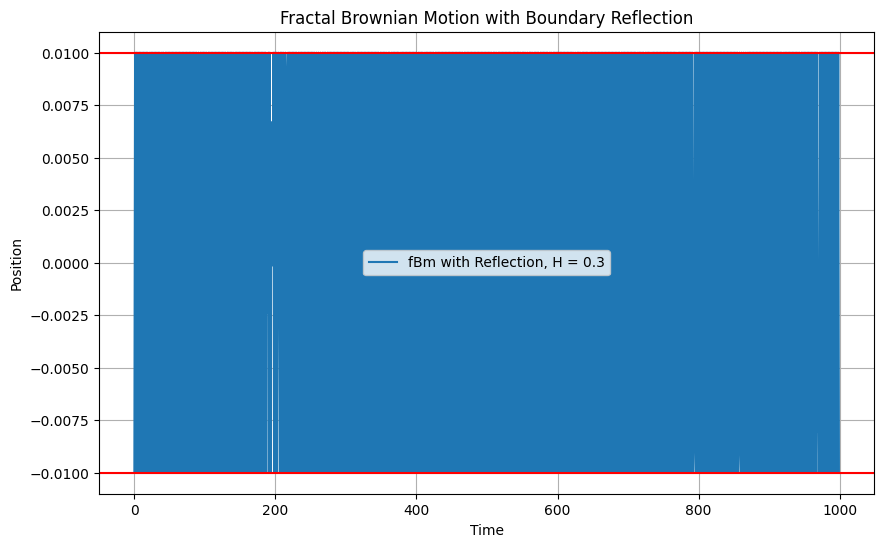

In [ ]:
def fbm_dezeje(H = 0.5, steps = 1000, box_size = 1, fgn_generator = 1, tamprus = False):
    #visiskai netamprus atspindejimas, nes su tampriu nelabai veik maza deze
    #tai nelabai veikia maza deze maziau 1, nes fgn meta daznai 1.5 siekanciu rezultatus...
    if fgn_generator == 1:
        aa = fgn(N = steps, H = H)

    elif fgn_generator == 2:
        #from fbm import times
        from fbm import fgn as fgn2

        # Generate a fGn realization
        aa = fgn2(n=steps, hurst=H, length=1, method='daviesharte')

        # Get the times associated with the fBm
        #t_values = times(n=1024, length=1)



    xx = []
    x  = 0
    sign = 1 #sita apversiu jei iseis is ribu pradesiu ne prideti o atimti

    if (tamprus == True) and (np.max(aa)<box_size):

        print(f"fGn max = {np.max(aa):2.5f}, dėžutės dyds = {box_size}, generuojamas tamprus atspindėjimas.")
        for a in aa:
            #galima protingiau sita implementuot
            #nes gi tik maza dali laiko realiai reik patikrint
            #dauguma laiko esam gan sure, jog krasto nekirs

            x += sign*a
            #print(f"x = {x:2.2f} < {box_size} = box, a = {a}" )
            if abs(x) >= box_size:
                #apverciam sign, jei sutampa paskutiniai a
                sign *= -1

                #tamprus, bet reik dezes_dydzio>max(fgn) = 2
                x += 2*sign*a #tamprus bet veik tik dezes dydziui virs 1.5

                if abs(x) > box_size:
                    print("fuck smth ain't working")

            xx.append(x)
    else:
        galima = "bet galima ir tamprų" if np.max(aa) < box_size else "tamprus negalimas"
        print(f"fGn max = {np.max(aa):2.2f}, dėžutės dyds = {box_size}, generuojamas netamprus atspindėjimas, " + galima)

        #generuojam fbm:
        for a in aa:
            #galima protingiau sita implementuot
            #nes gi tik maza dali laiko realiai reik patikrint
            #dauguma laiko esam gan sure, jog krasto nekirs

            x += sign*a
            #print(f"x = {x:2.2f} < {box_size} = box, a = {a}" )
            if abs(x) >= box_size:
                #apverciam sign, jei sutampa paskutiniai a
                sign *= -1

                #duslus
                x = sign*box_size

                if abs(x) > box_size:
                    print("fuck smth ain't working")

            xx.append(x)

    return xx


# fBm generavimas

H = 0.3
box_size =0.01
xx = fbm_dezeje(H=H, steps = 1000, box_size = box_size, fgn_generator=2, tamprus = True)




# Rezultato vaizdavimas
plt.figure(figsize=(10, 6))
plt.plot(xx, label=f'fBm with Reflection, H = {H}')
plt.axhline(y=box_size, color='r', linestyle='-')
plt.axhline(y=-box_size, color='r', linestyle='-')


plt.xlabel('Time')
plt.ylabel('Position')
plt.title('Fractal Brownian Motion with Boundary Reflection')
plt.legend()
plt.grid(True)
plt.show()
#lovely dbr dedam į tai kas mūms svarbu! testuojam Multifraktališkumą.

## Kraštinės sąlygos įvairūs būdai shit

---



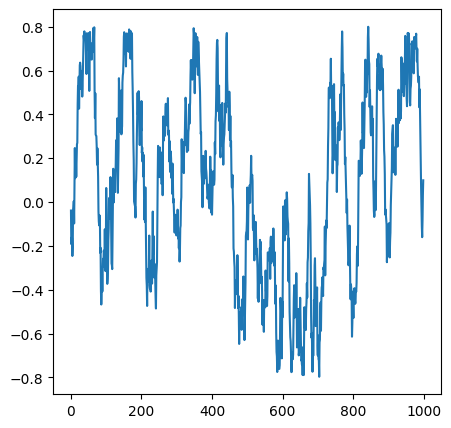

In [ ]:
import numpy as np

def post_processed_mirror_reflection_bounded_fbm(noise, box_size=1):
    """
    Generate an unbounded fractional Brownian motion and then apply mirror-style boundary conditions
    in a separate pass to ensure the motion remains within specified boundaries.

    Parameters:
    - noise (np.ndarray): An array of noise increments, representing the fractional Gaussian noise.
    - box_size (float): The size of the bounding box for the motion.

    Returns:
    - np.ndarray: The simulated bounded fractional Brownian motion after applying boundary conditions.
    """
    # Step 1: Generate unbounded FBM
    unbounded_fbm = np.cumsum(noise)

    # Step 2: Apply boundary conditions in a separate pass
    bounded_fbm = np.zeros_like(unbounded_fbm)
    position = 0

    for i, position in enumerate(unbounded_fbm):
        # Reflect if the position goes outside the boundary
        while abs(position) > box_size:
            if position > box_size:
                overshoot = position - box_size
                position = box_size - overshoot
            elif position < -box_size:
                overshoot = -box_size - position
                position = -box_size + overshoot

        bounded_fbm[i] = position

    return bounded_fbm

# Example usage (commented out for now)
noise_data = np.random.normal(0, 0.1, 1000)  # Generating some random noise
result = post_processed_mirror_reflection_bounded_fbm(noise_data, box_size=0.8)
plt.plot(result)



In [ ]:
N = 1000
h = 0.5
generation_methods = ['hosking', 'cholesky','daviesharte']
box_size = 4

f = FBM(n=N, hurst=h, length=N, method=generation_methods[2])
y = f.fbm()[1:]

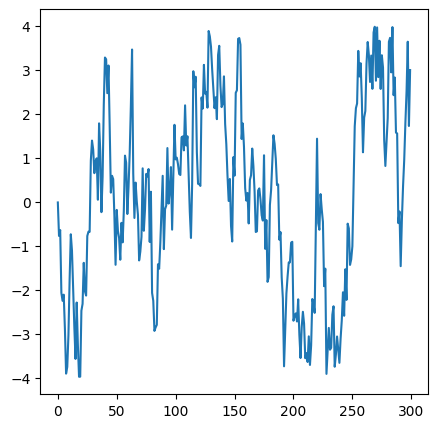

In [ ]:
plt.plot(judesys_dezeje(y, box_size=box_size)[:300])

In [ ]:
def fbm_dezeje_geguze(steps = 1000,  H = 0.5, box_size = 1):
    f = FBM(n=steps, hurst=H, length=1, method='daviesharte')
    y = f.fbm()[1:]
    return judesys_dezeje(y, box_size=box_size), y

In [ ]:
def hurstai(xx):
    try:
        higuchi = 2-higuchi1(xx)
    except:
        print("fuck higuchi")
        higuchi='error'
    try:
        msd = myMSD(xx)
    except:
        print("fuck msd")
        msd = 'error'
    try:
        rs = myRS(xx)
    except:
        print("fuck rs")
        rs = 'error'

    return higuchi, msd, rs

In [ ]:
def netampri_krastine_salyga_v1(realizacija, d):
    realizacija_dezeje = [] #d := dezes dydis
    for X in realizacija:
        if   X >  d:
            X  =  d
        elif X < -d:
            X  = -d
        realizacija_dezeje.append(X)
    return np.array(realizacija_dezeje)


def tampri_krastine_salyga(realizacija, d=1):
    realizacija_dezeje = []
    position = 0

    for position in realizacija:
        # Reflect if the position goes outside the boundary nu sita gera yra!
        while abs(position) > box_size:
            if position > d:
                overshoot = position - d
                position = d - overshoot
            elif position < -d:
                overshoot = -d - position
                position = -d + overshoot

        realizacija_dezeje.append(position)

    return np.array(realizacija_dezeje)


def netampri_krastine_salyga_v2(realizacija, d):
    realizacija_dezeje = []
    X = 0
    realizacija_dezeje.append(X)
    dXX = realizacija[1:]-realizacija[:-1]  #gaunam prieaugius
    for dX in dXX:
        #po viena priaugi pridedam
        X += dX
        #jei lipa X virs dezes -- neleidziame
        if   X > d:
            X =  d
        elif X <-d:
            X = -d
        realizacija_dezeje.append(X)
    return np.array(realizacija_dezeje)


def kimbanti_krastine_salyga(realizacija, d, P_kibimo =0.5):
    realizacija_dezeje = []
    X = 0
    realizacija_dezeje.append(X)
    dXX = realizacija[1:]-realizacija[:-1] #dXX prieaugiai
    for dX in dXX:
        if abs(X) == d: #jei prie sienos prikibes
            #mesk kauliuka ar atlipsi
            if np.random.random()>P_kibimo:
                X += dX
        else: #jei prie sienos neprikibes
            X += dX
        #dezes prasokti negalima
        if   X >  d:
            X = d
        elif X < -d:
            X = -d
        realizacija_dezeje.append(X)
    return np.array(realizacija_dezeje) #grazinam realizacija

krastines_salygos = [netampri_krastine_salyga_v1,
                    netampri_krastine_salyga_v2,
                    tampri_krastine_salyga,
                    kimbanti_krastine_salyga]


# WAVELETY


Lag-1 autocorrelation = 0.22
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037]
Lag-1 autocorrelation = 0.06
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.817370576237

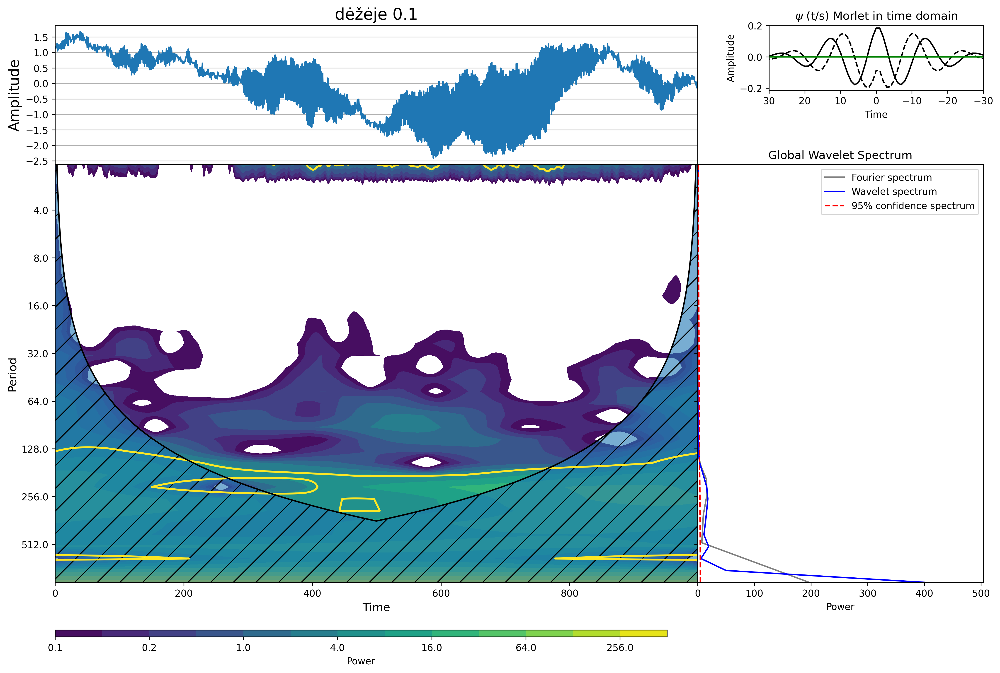

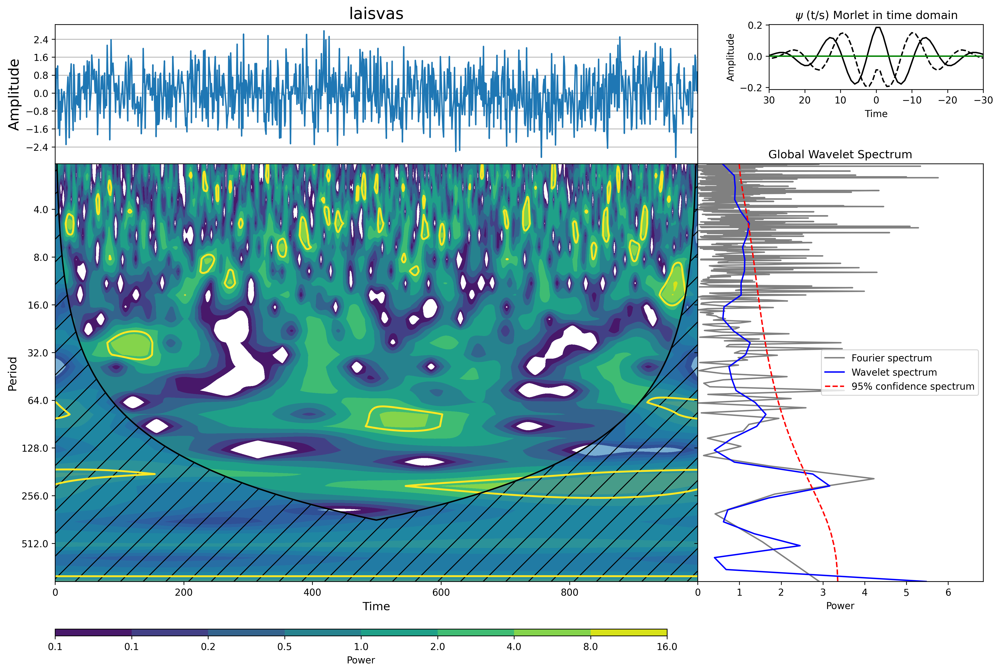

In [ ]:
# Example usage (commented out for now)
noise_data = np.random.normal(0, 0.1, 1000)  # Generating some random noise
result = mirror_reflection_bounded_fbm(noise_data, box_size = 0.1)
# print(result)
data_norm = waipy.normalize(result)
label='sdf'
time = np.arange(0, 1000)

alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot(f'dėžėje {box_size}', time, data_norm, 0.03125, result);

#noise_data = np.random.normal(0, 0.1, 1000)  # Generating some random noise
#result = #mirror_reflection_bounded_fbm(noise_data)
result = noise_data
# print(result)
data_norm = waipy.normalize(result)
label='sdf'
time = np.arange(0, 1000)

alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot('laisvas', time, data_norm, 0.03125, result);

ivesties H = 0.1
H free: 0.10591282600804508
H boxed: -0.013139120492516643
Lag-1 autocorrelation = 0.63
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037]
Lag-1 autocorrelation = -0.02
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.

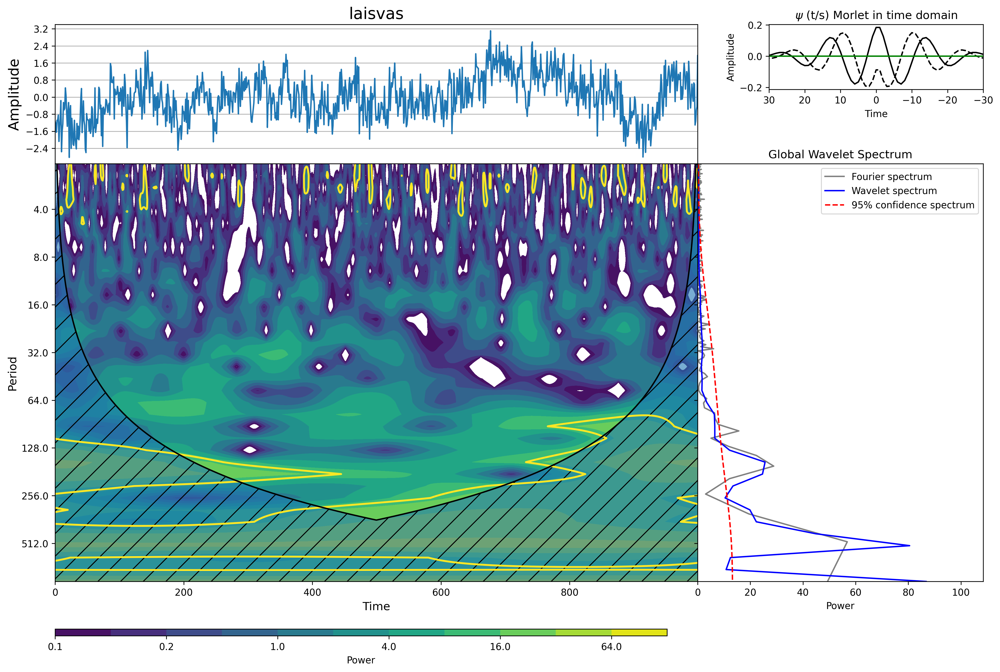

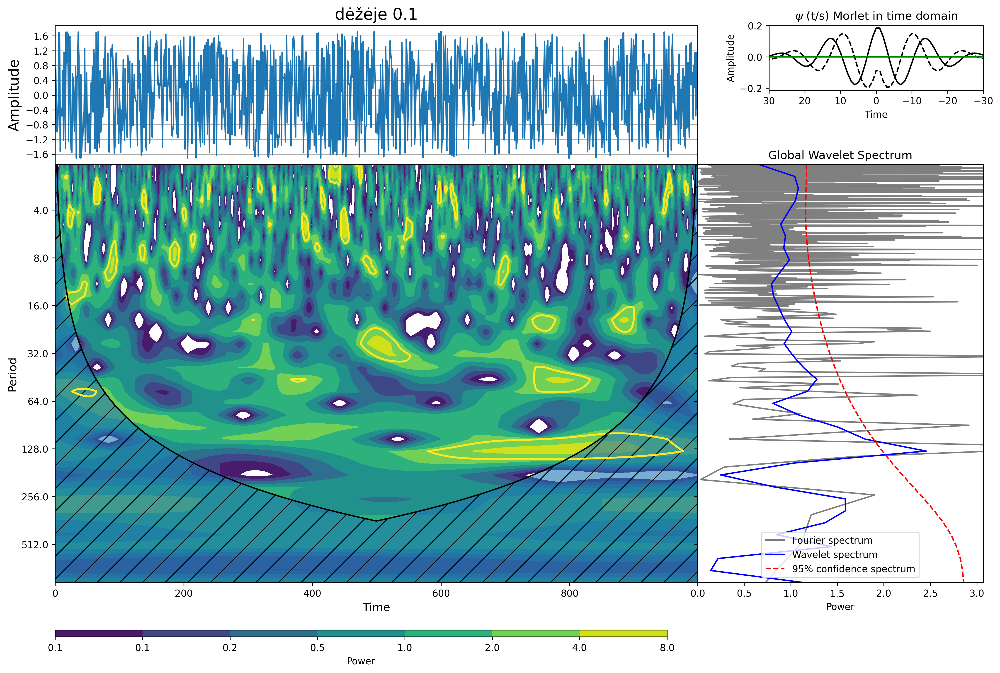

In [ ]:
# Example usage (commented out for now)

box_size = 0.1
N = 1000
H = 0.7
print(f'ivesties H = {H}')


f = FBM(n=N, hurst=H, length=1, method='daviesharte')
y_free = f.fbm()[1:]
hout = 2-higuchi1(y_free)
print(f'H free: {hout}')
#hh_free_out.append(hout)

y_boxed = judesys_dezeje(y_free, box_size=box_size)
hout = 2-higuchi1(y_boxed)
print(f'H boxed: {hout}')
#hh_box_out.append(hout)


#noise_data = np.random.normal(0, 0.1, 1000)  # Generating some random noise
#result = #mirror_reflection_bounded_fbm(noise_data)
result = y_free
# print(result)
data_norm = waipy.normalize(result)
label='sdf'
time = np.arange(0, N)

alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot('laisvas', time, data_norm, 0.03125, result);



result = y_boxed
# print(result)
data_norm = waipy.normalize(result)
label='sdf'


alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot(f'dėžėje {box_size}', time, data_norm, 0.03125, result);



ivesties H = 0.7
H free: 0.6710567878490681
H boxed: 0.6378461896147802
Lag-1 autocorrelation = 1.00
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037]
Lag-1 autocorrelation = 0.99
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.90868

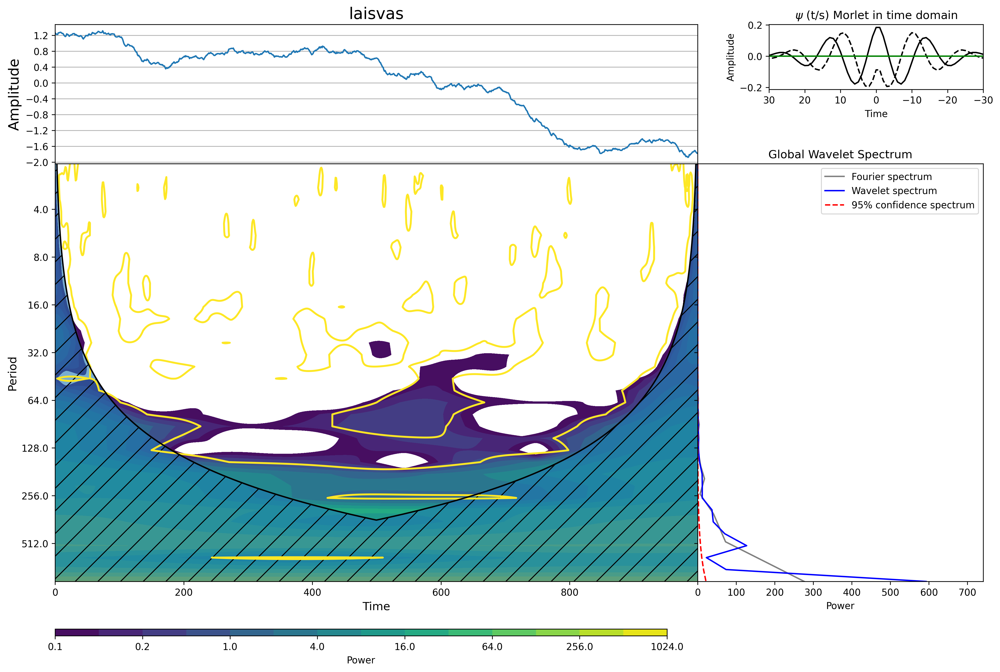

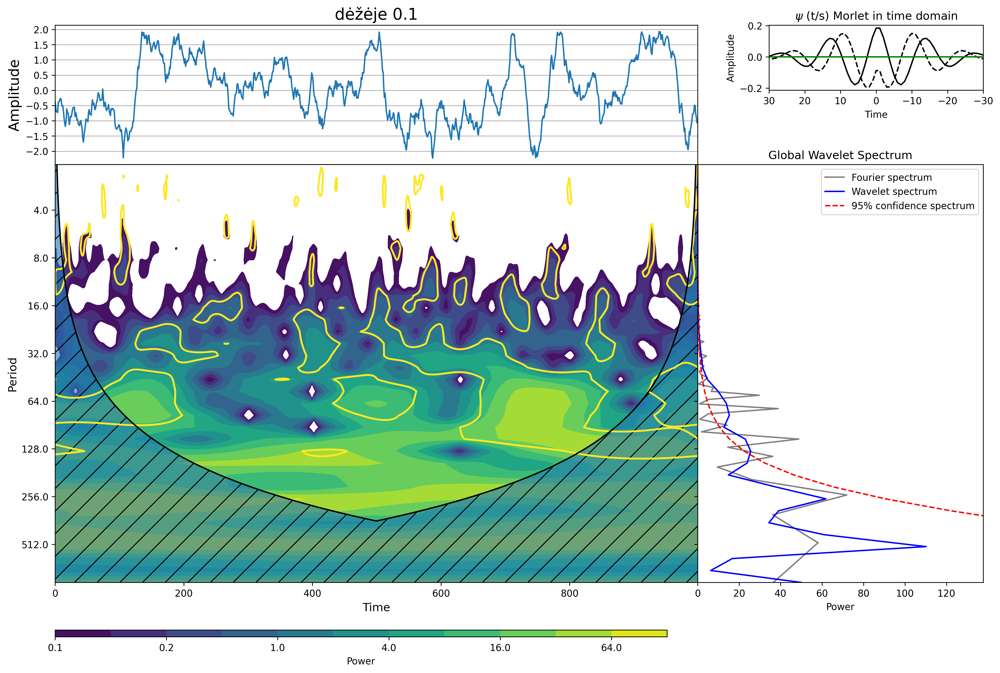

In [ ]:
# Example usage (commented out for now)

box_size = 0.1
N = 1000
H = 0.7
print(f'ivesties H = {H}')


f = FBM(n=N, hurst=H, length=1, method='daviesharte')
y_free = f.fbm()[1:]
hout = 2-higuchi1(y_free)
print(f'H free: {hout}')
#hh_free_out.append(hout)

y_boxed = judesys_dezeje(y_free, box_size=box_size)
hout = 2-higuchi1(y_boxed)
print(f'H boxed: {hout}')
#hh_box_out.append(hout)


#noise_data = np.random.normal(0, 0.1, 1000)  # Generating some random noise
#result = #mirror_reflection_bounded_fbm(noise_data)
result = y_free
# print(result)
data_norm = waipy.normalize(result)
label='sdf'
time = np.arange(0, N)

alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot('laisvas', time, data_norm, 0.03125, result);



result = y_boxed
# print(result)
data_norm = waipy.normalize(result)
label='sdf'


alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot(f'dėžėje {box_size}', time, data_norm, 0.03125, result);

# ya

ivesties H = 0.7
H free: 0.6988225660482825
H boxed: 0.6462429803175087
Lag-1 autocorrelation = 1.00
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.908685288118864, 32.0, 38.05462768008707, 45.254833995939045, 53.81737057623773, 64.0, 76.10925536017415, 90.50966799187809, 107.63474115247546, 128.0, 152.2185107203483, 181.01933598375618, 215.2694823049509, 256.0, 304.4370214406966, 362.03867196751236, 430.5389646099018, 512.0, 608.8740428813932, 724.0773439350247, 861.0779292198037]
Lag-1 autocorrelation = 0.99
Nr of Scales: 35
scales [2.0, 2.378414230005442, 2.8284271247461903, 3.363585661014858, 4.0, 4.756828460010884, 5.656854249492381, 6.727171322029716, 8.0, 9.513656920021768, 11.313708498984761, 13.454342644059432, 16.0, 19.027313840043536, 22.627416997969522, 26.90868

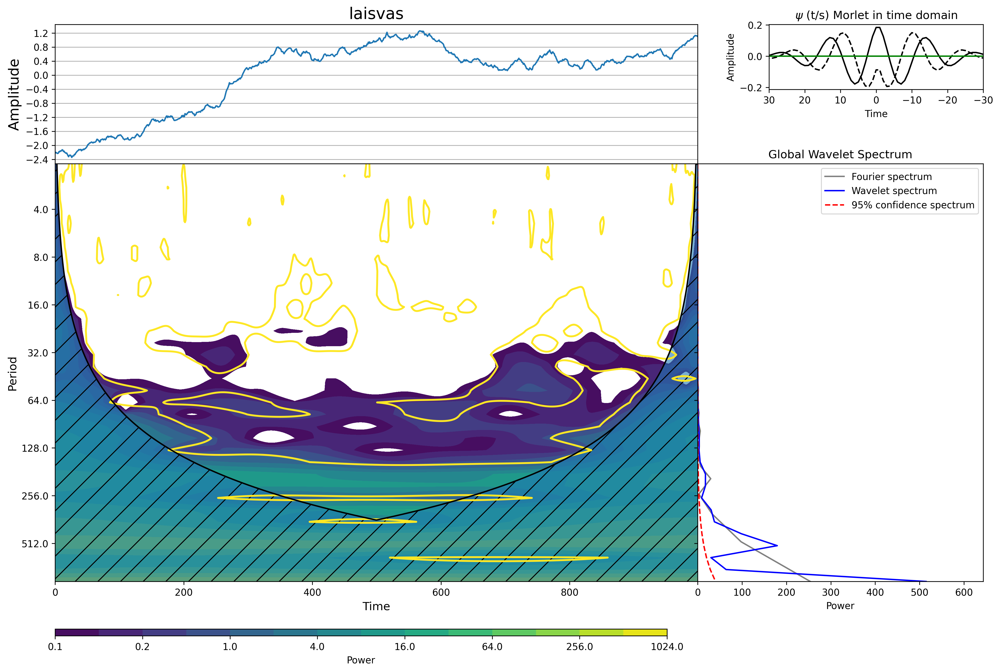

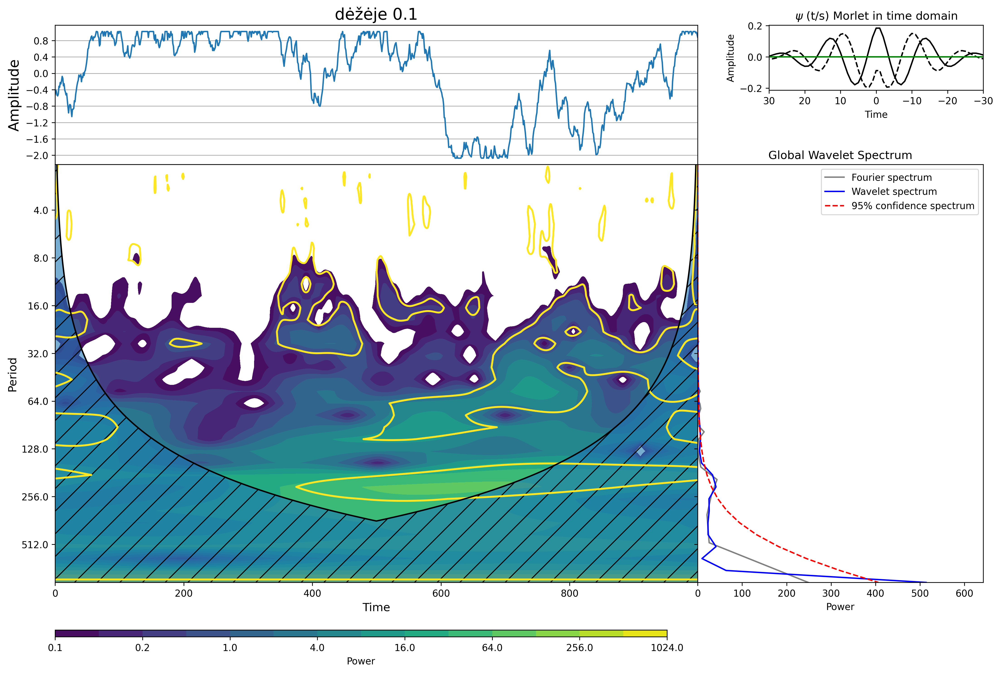

In [ ]:
# Example usage (commented out for now)

box_size = 0.1
N = 1000
H = 0.7
print(f'ivesties H = {H}')


f = FBM(n=N, hurst=H, length=1, method='daviesharte')
y_free = f.fbm()[1:]
hout = 2-higuchi1(y_free)
print(f'H free: {hout}')
#hh_free_out.append(hout)

y_boxed = netampri_krastine_salyga_v2(y_free, d=box_size)
hout = 2-higuchi1(y_boxed)
print(f'H boxed: {hout}')
#hh_box_out.append(hout)


#noise_data = np.random.normal(0, 0.1, 1000)  # Generating some random noise
#result = #mirror_reflection_bounded_fbm(noise_data)
result = y_free
# print(result)
data_norm = waipy.normalize(result)
label='sdf'
time = np.arange(0, N)

alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot('laisvas', time, data_norm, 0.03125, result);



result = y_boxed
# print(result)
data_norm = waipy.normalize(result)
label='sdf'


alpha = np.corrcoef(data_norm[0:-1], data_norm[1:])[0,1];
print("Lag-1 autocorrelation = {:4.2f}".format(alpha))
result = waipy.cwt(data_norm, 1, 1, 0.25, 2, 4/0.25, alpha, 6, mother='Morlet', name='penis')
waipy.wavelet_plot(f'dėžėje {box_size}', time, data_norm, 0.03125, result);

In [ ]:
plt.rcParams["figure.figsize"] = (5,3)

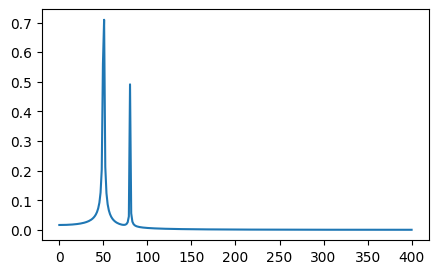

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.fftpack

# Number of samplepoints
N = 600
# sample spacing
T = 1.0 / 800.0
x = np.linspace(0.0, N*T, N)
y = np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)
yf = scipy.fftpack.fft(y)
xf = np.linspace(0.0, 1.0/(2.0*T), N//2)

fig, ax = plt.subplots()
ax.plot(xf, 2.0/N * np.abs(yf[:N//2]))
plt.show()


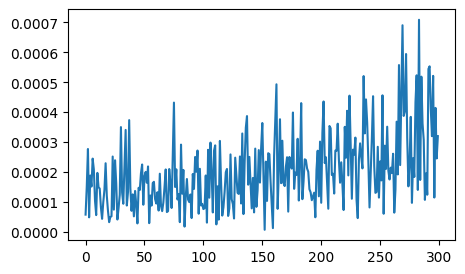

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.fftpack

# Number of samplepoints
# sample spacing
T = 1.0 / 800.0

#y = np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)
y = xx

yf = scipy.fftpack.fft(y)

fig, ax = plt.subplots()
ax.plot(2.0/N * np.abs(yf[:N//2]))
plt.show()

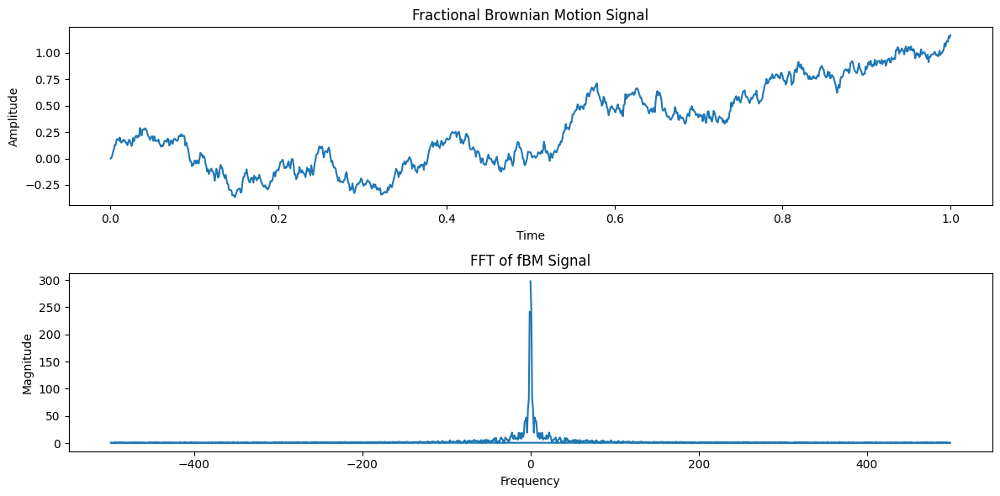

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from fbm import FBM

# Step 1: Generate the fractional Brownian motion (fBM) signal
n = 1000  # Number of steps
hurst = 0.5  # Hurst parameter

f = FBM(n=n, hurst=hurst, length = 1)
xx = f.fbm()
tt = f.times()

# Step 2: Apply the FFT
fft_result = np.fft.fft(xx)
fft_freq = np.fft.fftfreq(len(xx), d=(tt[1] - tt[0]))  # Compute the sample frequencies

# Step 3: Visualize the results
plt.figure(figsize=(12, 6))

# Plot the original fBM signal
plt.subplot(2, 1, 1)
plt.plot(tt, xx)
plt.title('Fractional Brownian Motion Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot the FFT result (magnitude)
plt.subplot(2, 1, 2)
plt.plot(fft_freq, np.abs(fft_result))
plt.title('FFT of fBM Signal')
plt.xlabel('Frequency')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()


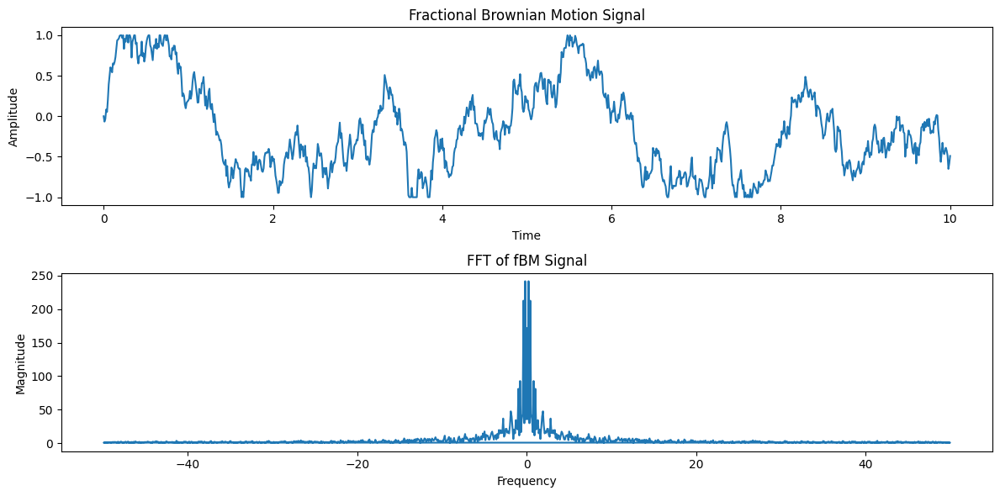

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from fbm import FBM

# Step 1: Generate the fractional Brownian motion (fBM) signal
n = 1000  # Number of steps
hurst = 0.5  # Hurst parameter

f = FBM(n=n, hurst=hurst, length = 10)
xx0=f.fbm()
xx = netampri_krastine_salyga_v2(xx0, d=1)
tt = f.times()

# Step 2: Apply the FFT
fft_result = np.fft.fft(xx)
fft_freq = np.fft.fftfreq(len(xx), d=(tt[1] - tt[0]))  # Compute the sample frequencies

# Step 3: Visualize the results
plt.figure(figsize=(12, 6))

# Plot the original fBM signal
plt.subplot(2, 1, 1)
plt.plot(tt, xx)
plt.title('Fractional Brownian Motion Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot the FFT result (magnitude)
plt.subplot(2, 1, 2)
plt.plot(fft_freq, np.abs(fft_result))
plt.title('FFT of fBM Signal')
plt.xlabel('Frequency')
plt.ylabel('Magnitude')

plt.tight_layout()
plt.show()

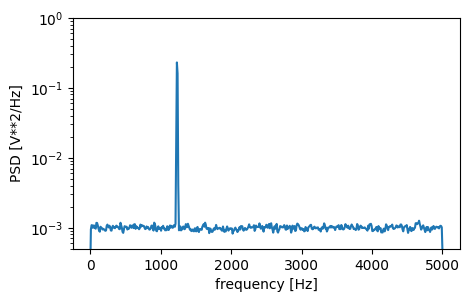

In [ ]:
import numpy as np

from scipy import signal

import matplotlib.pyplot as plt

rng = np.random.default_rng()

fs = 10e3

N = 1e5

amp = 2*np.sqrt(2)

freq = 1234.0

noise_power = 0.001 * fs / 2

time = np.arange(N) / fs

x = amp*np.sin(2*np.pi*freq*time)

x += rng.normal(scale=np.sqrt(noise_power), size=time.shape)



f, Pxx_den = signal.welch(x, fs, nperseg=1024)

plt.semilogy(f, Pxx_den)

plt.ylim([0.5e-3, 1])

plt.xlabel('frequency [Hz]')

plt.ylabel('PSD [V**2/Hz]')

plt.show()

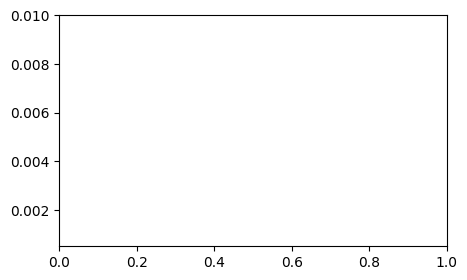

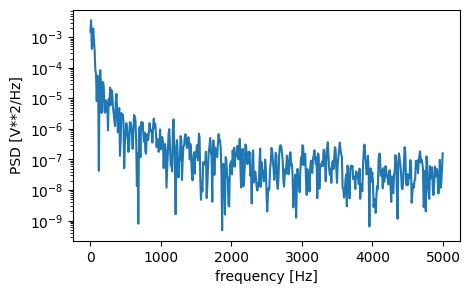

In [ ]:


furje(xx)

In [ ]:
import numpy as np

from scipy import signal

import matplotlib.pyplot as plt

# Step 1: Generate the fractional Brownian motion (fBM) signal
n = 1000  # Number of steps
hurst = 0.5  # Hurst parameter

f = FBM(n=n, hurst=hurst, length = 1)
xx = f.fbm()

def furje(x, ax=None, log=True, **kwargs):

    f, Pxx_den = signal.welch(x, fs, nperseg=1024)
    #plt.ylim([0.5e-3, 0.1])
    if ax==None:
        fig, ax = plt.subplots(1,1)
    if log:
        ax.semilogy(f, Pxx_den, **kwargs)
    else:
        ax.plot(f, Pxx_den,**kwargs)
    #plt.plot(f,Pxx_den)
    #plt.ylim([0.5e-3, 1])

    ax.set_xlabel('Dažnis [Hz]')

    ax.set_ylabel('PSD')


fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs


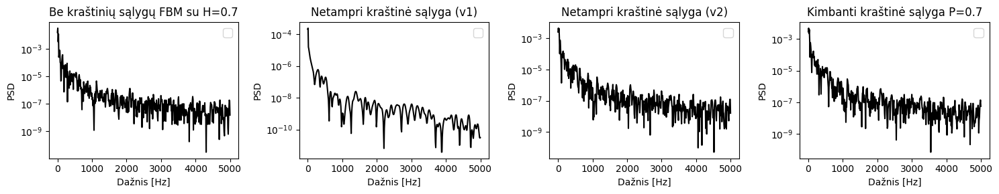

In [ ]:
def plotKrastines(H =0.7):
    f = FBM(n=1000, hurst=H, length=10, method='daviesharte')

    d = 1

    fig, [ax0,ax1, ax2,ax4] = plt.subplots(1,4, figsize=(15,3))

    axes = [ax0,ax1,ax2,ax4]




    xx0 = f.fbm()
    ax0.set_title(f'Be kraštinių sąlygų FBM su H={H}')


    xx1 = netampri_krastine_salyga_v1(xx0, d = d)
    ax1.set_title('Netampri kraštinė sąlyga (v1)')


    xx2 = netampri_krastine_salyga_v2(xx0, d = d)
    ax2.set_title('Netampri kraštinė sąlyga (v2)')




    xx4 = kimbanti_krastine_salyga(xx0, d = d, P_kibimo =0.7)
    ax4.set_title('Kimbanti kraštinė sąlyga P=0.7')


    xxx = [xx0,xx1,xx2,xx4]

    for ax,xx in zip(axes,xxx):
        higuchi, msd, rs = hurstai(xx)
        try:
            LABELIS= r'$H_{Higuchi}=$'+f'{higuchi:1.2f}'\
                +'\n'+'$H_{MSD}=$'+f'{msd:1.2f}'\
                +'\n'+r'$H_{RS}=$'+f'{rs:1.2f}'
            furje(xx, ax, log=True,label = LABELIS)
        except:
            furje(xx, ax, log=True,color="black")
        ax.legend(fontsize=13)

    fig.tight_layout()
    return xx0

xx=plotKrastines()

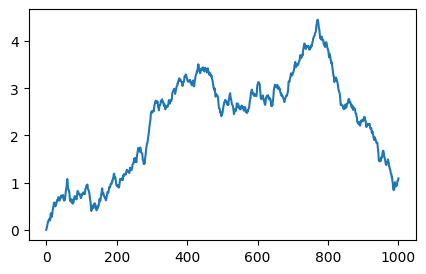

In [ ]:
plt.plot(xx)

/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 1024 is greater than input length  = 1001, using nperseg = 1001
  warnings.warn('nperseg = {0:d} is greater than input length '


fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs


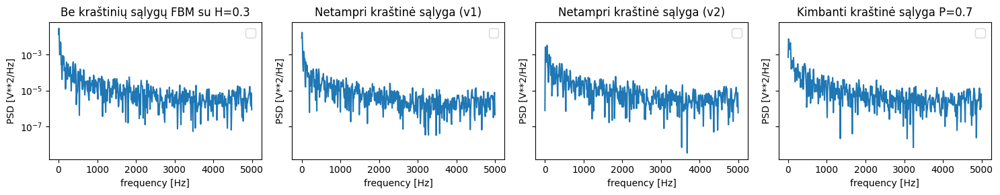

In [ ]:
plotKrastines(H =0.3)

In [ ]:

def plotKrastines(H =0.7):
    f = FBM(n=1000, hurst=H, length=10, method='daviesharte')

    d = 1

    fig, [ax0,ax1, ax2,ax3,ax4] = plt.subplots(1,5, figsize=(15,3), sharey = True, sharex=True)

    axes = [ax0,ax1,ax2,ax3,ax4]



    xx0 = f.fbm()
    ax0.set_title(f'Be kraštinių sąlygų FBM su H={H}')


    xx1 = netampri_krastine_salyga_v1(xx0, d = d)
    ax1.set_title('Netampri kraštinė sąlyga (v1)')


    xx2 = netampri_krastine_salyga_v2(xx0, d = d)
    ax2.set_title('Netampri kraštinė sąlyga (v2)')


    xx3 = tampri_krastine_salyga(xx0, d = d)
    ax3.set_title('Tampri kraštinė sąlyga')

    xx4 = kimbanti_krastine_salyga(xx0, d = d, P_kibimo =0.7)
    ax4.set_title('Kimbanti kraštinė sąlyga P=0.7')


    xxx = [xx0,xx1,xx2,xx3,xx4]

    for ax,xx in zip(axes,xxx):
        ax.axhline(y=box_size, linestyle='--',color='red')
        ax.axhline(y=-box_size, linestyle='--',color='red')
        higuchi, msd, rs = hurstai(xx)
        ax.plot(xx,color='black',\
            label = r'$H_{Higuchi}=$'+f'{higuchi:1.2f}'\
            +'\n'+'$H_{MSD}=$'+f'{msd:1.2f}'\
            +'\n'+'$H_{RS}=$'+f'{rs:1.2f}')

        ax.legend(fontsize=13)

    fig.tight_layout()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x78c98a921000> (for post_execute):


KeyboardInterrupt: 

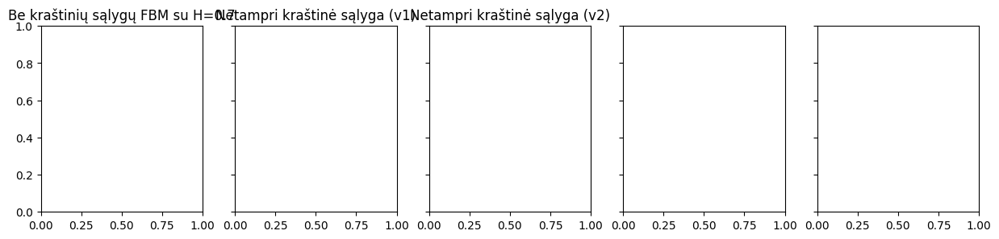

In [ ]:
plotKrastines(H =0.7)

In [ ]:
tampri_krastine_salyga(xx0)

KeyboardInterrupt: 

fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs


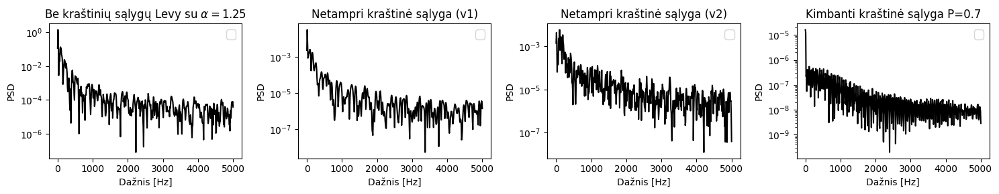

In [102]:
#@title plot for levy
from scipy.stats import levy_stable


def plotKrastines(H =0.7):
    f = FBM(n=1000, hurst=H, length=10, method='daviesharte')

    d = 1

    fig, [ax0,ax1, ax2,ax4] = plt.subplots(1,4, figsize=(15,3))

    axes = [ax0,ax1,ax2,ax4]




    #xx0 = f.fbm()
    xx0 = levy_stable.rvs(alpha=1.25, beta=0, size=1000).cumsum()/10

    ax0.set_title(r'Be kraštinių sąlygų Levy su $\alpha=1.25$')


    xx1 = netampri_krastine_salyga_v1(xx0, d = d)
    ax1.set_title('Netampri kraštinė sąlyga (v1)')


    xx2 = netampri_krastine_salyga_v2(xx0, d = d)
    ax2.set_title('Netampri kraštinė sąlyga (v2)')




    xx4 = kimbanti_krastine_salyga(xx0, d = d, P_kibimo =0.99)
    ax4.set_title('Kimbanti kraštinė sąlyga P=0.7')


    xxx = [xx0,xx1,xx2,xx4]

    for ax,xx in zip(axes,xxx):
        higuchi, msd, rs = hurstai(xx)
        try:
            LABELIS= r'$H_{Higuchi}=$'+f'{higuchi:1.2f}'\
                +'\n'+'$H_{MSD}=$'+f'{msd:1.2f}'\
                +'\n'+r'$H_{RS}=$'+f'{rs:1.2f}'
            furje(xx, ax, log=True,label = LABELIS)
        except:
            furje(xx, ax, log=True,color="black")
        ax.legend(fontsize=13)

    fig.tight_layout()
    return xx0

xx=plotKrastines()

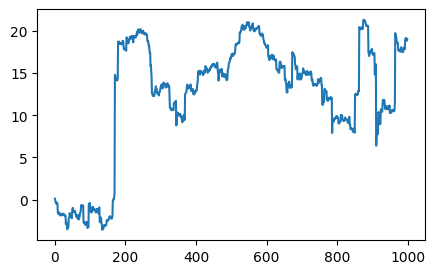

In [101]:
plt.plot(xx)

/usr/local/lib/python3.10/dist-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 1024 is greater than input length  = 1000, using nperseg = 1000
  warnings.warn('nperseg = {0:d} is greater than input length '


fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs
fuck msd
fuck rs


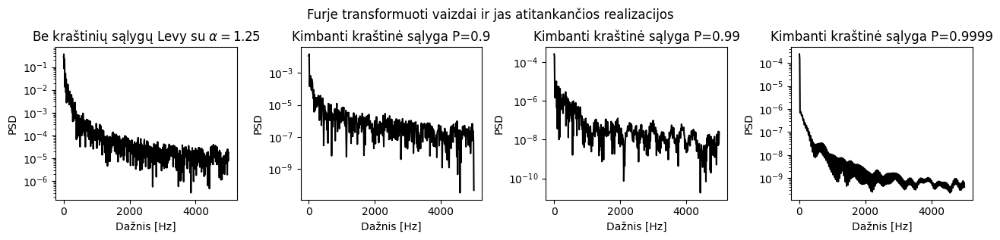

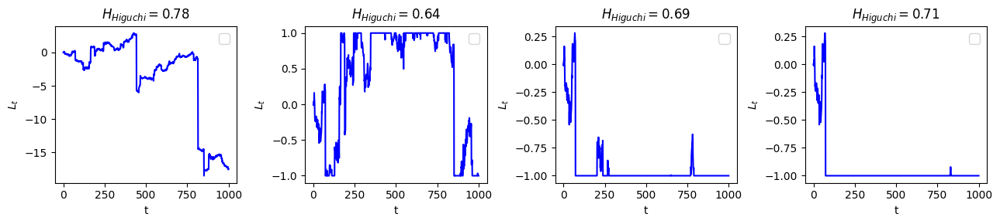

In [125]:
#@title plot for levy
from scipy.stats import levy_stable


def plotKrastines(H =0.7):
    f = FBM(n=1000, hurst=H, length=10, method='daviesharte')

    d = 1

    fig, [ax0,ax1, ax2,ax4] = plt.subplots(1,4, figsize=(13,3))
    axes = [ax0,ax1,ax2,ax4]

    fig2, [bx0,bx1, bx2,bx4] = plt.subplots(1,4, figsize=(13,3))
    baxes= [bx0,bx1, bx2,bx4]


    #xx0 = f.fbm()
    xx0 = levy_stable.rvs(alpha=1.25, beta=0, size=1000).cumsum()/30

    ax0.set_title(r'Be kraštinių sąlygų Levy su $\alpha=1.25$')


    xx1 = kimbanti_krastine_salyga(xx0, d = d, P_kibimo =0.9)
    ax1.set_title('Kimbanti kraštinė sąlyga P=0.9')

    xx2 = kimbanti_krastine_salyga(xx0, d = d, P_kibimo =0.99)
    ax2.set_title('Kimbanti kraštinė sąlyga P=0.99')




    xx4 = kimbanti_krastine_salyga(xx0, d = d, P_kibimo =0.9999)
    ax4.set_title('Kimbanti kraštinė sąlyga P=0.9999')


    xxx = [xx0,xx1,xx2,xx4]
    i =0
    for bax, ax,xx in zip(baxes,axes,xxx):

        higuchi, msd, rs = hurstai(xx)
        try:
            LABELIS= r'$H_{Higuchi}=$'+f'{higuchi:1.2f}'
            furje(xx, ax, log=True, color='black')
            bax.plot(xx, color='blue')
            bax.set_title(f'{LABELIS}')
            if i>1:
                bax.set_ylim(-1,1) #nes pirmas isskrides
            bax.set_ylabel(r'$L_t$')
            bax.set_xlabel('t')
        except:
            furje(xx, ax, log=True,color="black")
        bax.legend(fontsize=13)
    i+=1
    fig.tight_layout()
    fig.suptitle('Furje transformuoti vaizdai ir jas atitankančios realizacijos', y=1.04)
    fig2.tight_layout()
    return xx0

xx=plotKrastines()

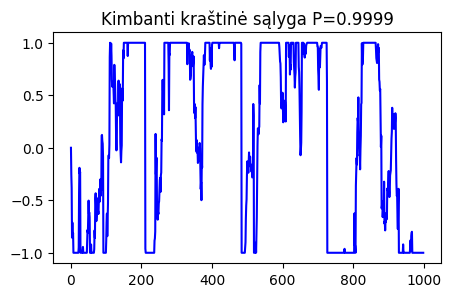

In [111]:

xx4 = kimbanti_krastine_salyga(xx, d = 1, P_kibimo =0.9)
plt.title('Kimbanti kraštinė sąlyga P=0.9999')
plt.plot(xx4, color='blue')